<a href="https://colab.research.google.com/github/surajjorwar/FitnessTracker/blob/main/count_repetations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
%cd '/content/drive/MyDrive/FitnessTracker/FitnessTracker/data-science-template-main/src/features'

/content/drive/MyDrive/FitnessTracker/FitnessTracker/data-science-template-main/src/features


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

pd.options.mode.chained_assignment = None



Plot settings

In [12]:
# Plot settings
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (20, 5)
plt.rcParams["figure.dpi"] = 100
plt.rcParams["lines.linewidth"] = 2


# Load data

In [131]:
df = pd.read_pickle('/content/drive/MyDrive/FitnessTracker/FitnessTracker/data-science-template-main/data/interim/01_data_processed.pkl')

df= df[df['label']!='rest']

acc_r = df['acc_x']**2 + df['acc_y']**2  +df['acc_z']**2
gyr_r = df['gyr_x']**2 + df['gyr_y']**2  +df['gyr_z']**2

df['acc_r'] = np.sqrt(acc_r)
df['gyr_r'] = np.sqrt(gyr_r)

# Split data

In [17]:
bench_df = df[df['label']== 'bench']
squat_df = df[df['label']== 'squat']
row_df = df[df['label']== 'row']
ohp_df = df[df['label']== 'ohp']
dead_df = df[df['label']== 'dead']

# Visualize data to identify patterns

In [23]:
plot_df = squat_df

<Axes: xlabel='epoch (ms)'>

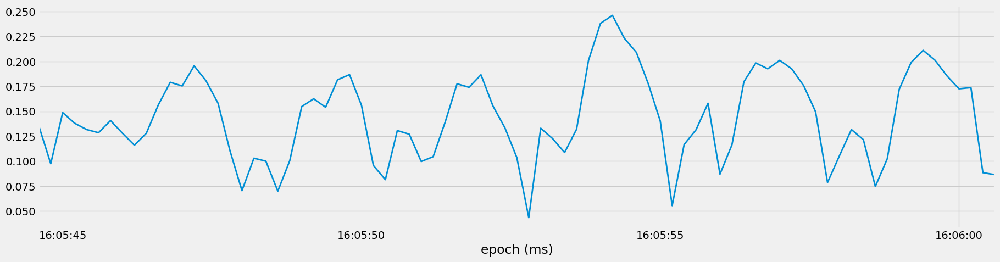

In [24]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['acc_x'].plot()

<Axes: xlabel='epoch (ms)'>

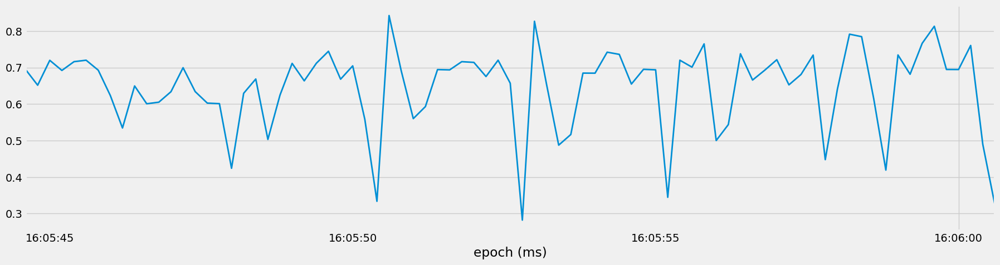

In [25]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['acc_y'].plot()

<Axes: xlabel='epoch (ms)'>

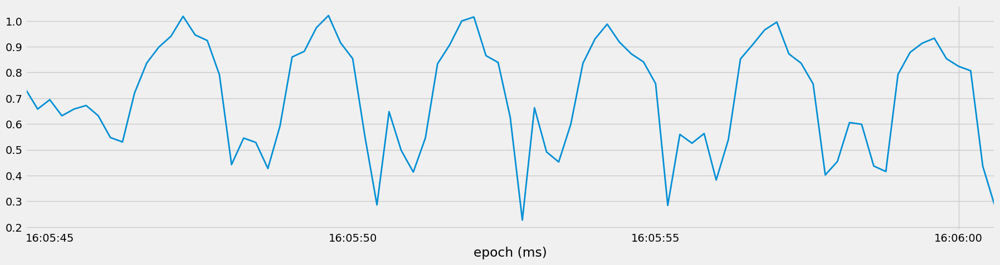

In [26]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['acc_z'].plot()

<Axes: xlabel='epoch (ms)'>

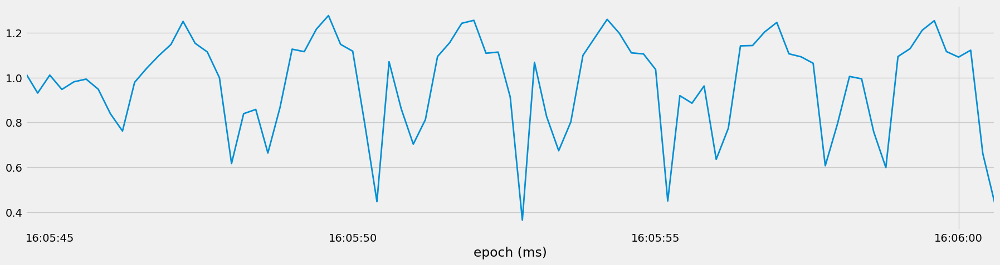

In [27]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['acc_r'].plot()

<Axes: xlabel='epoch (ms)'>

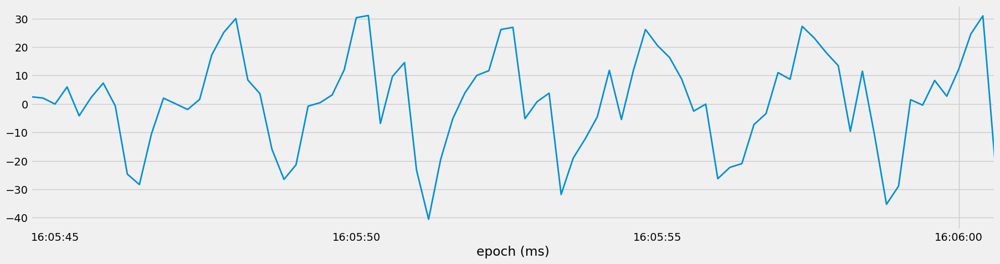

In [30]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['gyr_x'].plot()

In [ ]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['gyr_y'].plot()

<Axes: xlabel='epoch (ms)'>

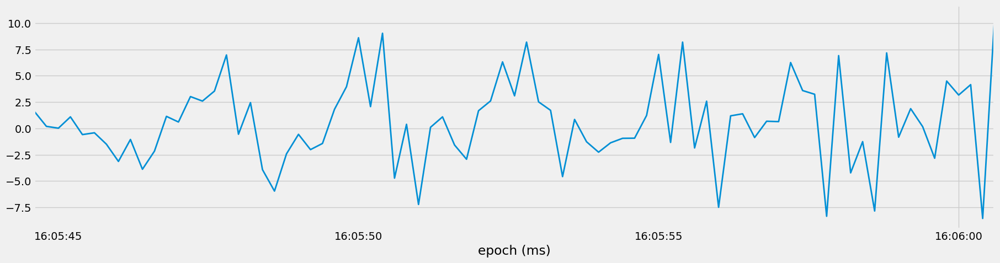

In [29]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['gyr_z'].plot()

<Axes: xlabel='epoch (ms)'>

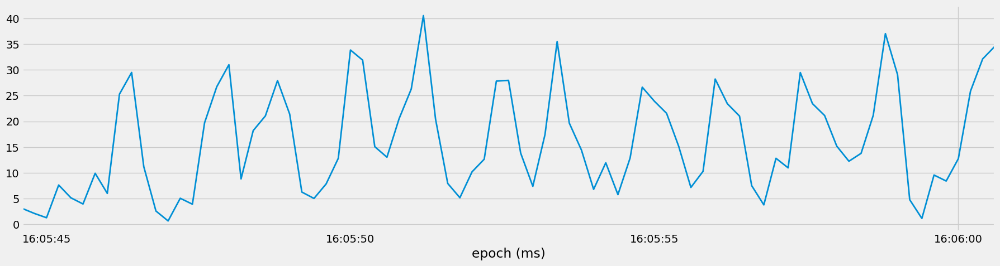

In [28]:
plot_df[plot_df['set']==plot_df['set'].unique()[0]]['gyr_r'].plot()

# Configure LowPassFilter

In [31]:
fs = 1000 / 200
LowPass = LowPassFilter()

# Apply and tweak LowPassFilter

In [53]:
bench_set = bench_df[bench_df['set']==bench_df['set'].unique()[0]]
squat_set = squat_df[squat_df['set']==squat_df['set'].unique()[0]]
row_set = row_df[row_df['set']==row_df['set'].unique()[0]]
ohp_set = ohp_df[ohp_df['set']==ohp_df['set'].unique()[0]]
dead_set = dead_df[dead_df['set']==dead_df['set'].unique()[0]]

<Axes: xlabel='epoch (ms)'>

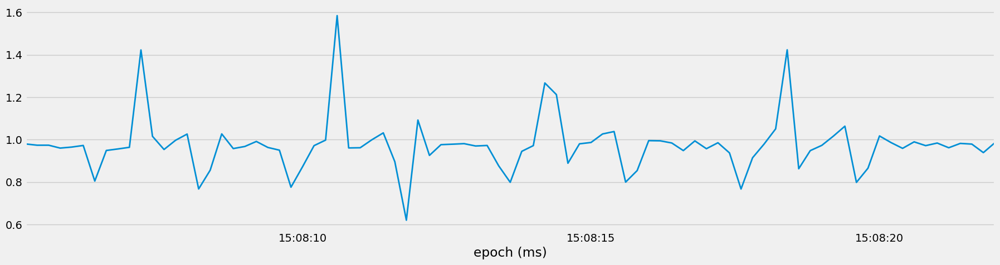

In [42]:
bench_set['acc_r'].plot()

<Axes: xlabel='epoch (ms)'>

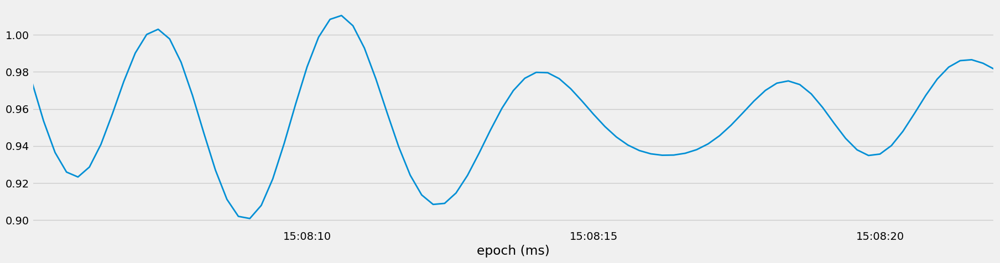

In [48]:
column = 'acc_y'
LowPass.low_pass_filter(
    bench_set,col = column,sampling_frequency = fs,cutoff_frequency=0.4,order = 10
    )[column + "_lowpass"].plot()

# Create function to count repetitions

In [58]:
bench_set = bench_df[bench_df['set']==bench_df['set'].unique()[0]]

column = 'acc_r'
data = LowPass.low_pass_filter(
    bench_set,col = column,sampling_frequency = fs,cutoff_frequency=0.4,order = 10
    )



In [60]:
indexes = argrelextrema(data[column + '_lowpass'].values , np.greater)
indexes

(array([11, 27, 46, 66, 82]),)

In [61]:
peaks = data.iloc[indexes]
peaks

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_r_lowpass
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:07.400,-0.163500,0.996000,-0.113000,35.5488,11.5732,-17.2074,B,bench,heavy,71,1.015636,41.155203,1.042914
2019-01-11 15:08:10.600,-0.220000,1.557000,-0.195500,11.3416,-5.0610,-12.4998,B,bench,heavy,71,1.584572,17.620744,1.054019
2019-01-11 15:08:14.400,-0.245667,1.184667,-0.077333,32.7318,0.8050,-10.5852,B,bench,heavy,71,1.212340,34.410249,1.023173
2019-01-11 15:08:18.400,-0.278000,1.393333,-0.085333,26.2194,5.9266,-20.8172,B,bench,heavy,71,1.423356,33.999079,1.019144
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,71,0.978938,3.034609,0.989466


In [102]:
def count_reps(dataset , cutoff =0.4 , order = 10 , column = 'acc_r'):
    data = LowPass.low_pass_filter(
        dataset,col = column,sampling_frequency = fs,cutoff_frequency = cutoff,order = order
    )
    indexes = argrelextrema(data[column + '_lowpass'].values , np.greater)
    peaks = data.iloc[indexes]

    fig , ax = plt.subplots()
    plt.plot(dataset[f"{column}_lowpass"])
    plt.plot(peaks[f"{column}_lowpass"],"o",color = 'red')
    ax.set_ylabel(f'{column}_lowpass')
    exercise = dataset['label'].iloc[0].title()
    category = dataset['category'].iloc[0].title()
    plt.title(f'{category} {exercise}: {len(peaks)} Reps')
    plt.show()



    return len(peaks)


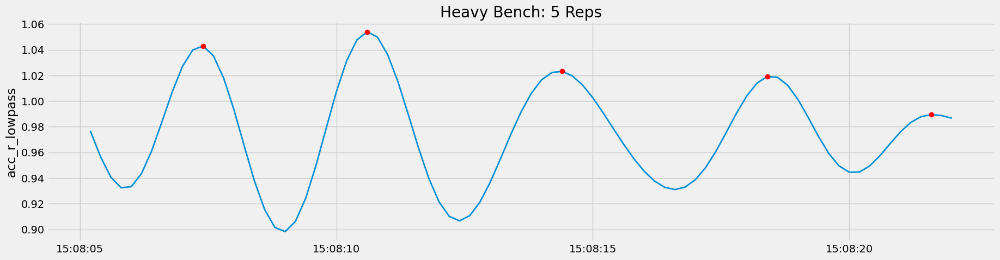

5


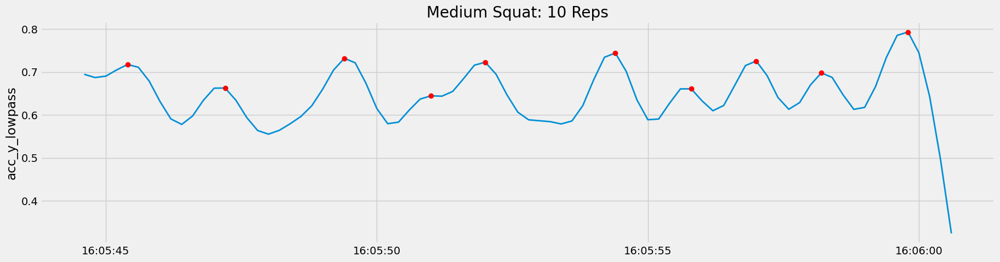

10


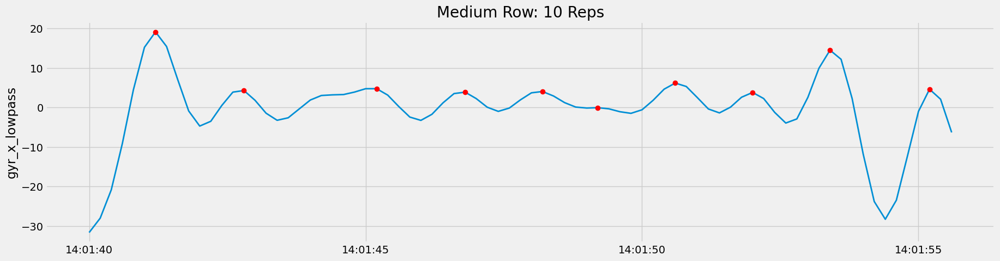

10


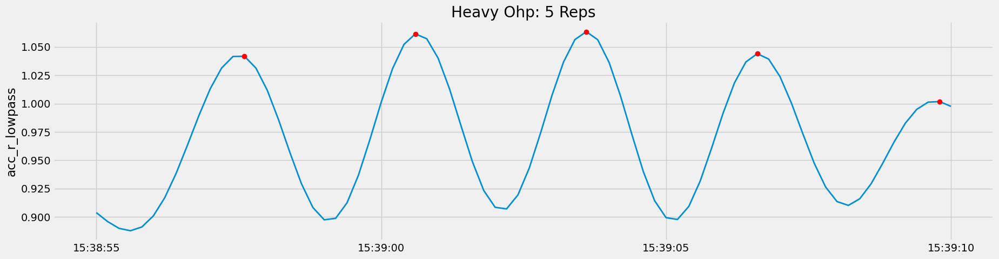

5


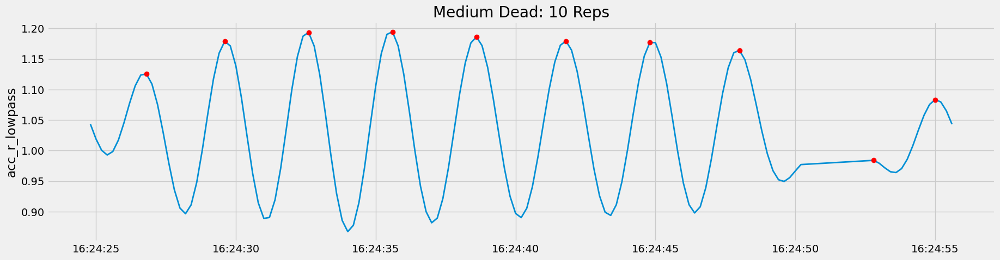

10


In [112]:
print(count_reps(bench_set,cutoff = 0.4))
print(count_reps(squat_set,cutoff = 0.83, column = 'acc_y',order = 8))
print(count_reps(row_set,cutoff = 0.65 , column = 'gyr_x'))
print(count_reps(ohp_set ,cutoff = 0.35))
print(count_reps(dead_set ,cutoff = 0.4))

# Create benchmark dataframe

In [125]:
df.groupby(['label','category','set'])['reps'].max().reset_index()

,label,category,set,reps
0,bench,heavy,3,5
1,bench,heavy,7,5
2,bench,heavy,12,5
3,bench,heavy,20,5
4,bench,heavy,39,5
...,...,...,...,...
86,squat,medium,56,10
87,squat,medium,59,10
88,squat,medium,64,10
89,squat,medium,88,10


In [113]:
df['reps'] = df['category'].apply(lambda x : 5 if x =='heavy' else 10)

In [121]:
df['reps'] = df['category'].apply(lambda x : 5 if x =='heavy' else 10)
rep_df = df.groupby(['label','category','set'])['reps'].max().reset_index()
rep_df['reps_pred'] = 0

In [122]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,3,5,0
1,bench,heavy,7,5,0
2,bench,heavy,12,5,0
3,bench,heavy,20,5,0
4,bench,heavy,39,5,0
...,...,...,...,...,...
86,squat,medium,56,10,0
87,squat,medium,59,10,0
88,squat,medium,64,10,0
89,squat,medium,88,10,0


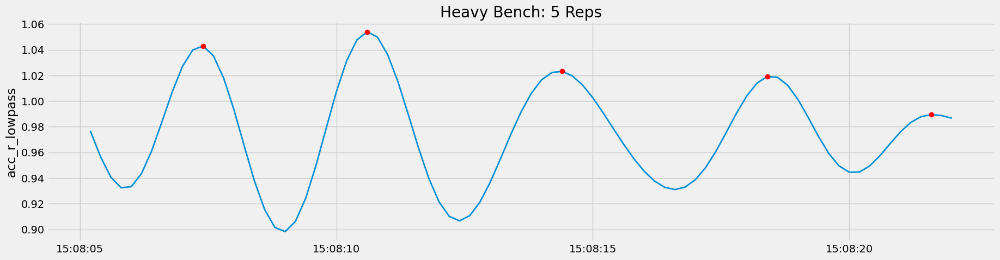

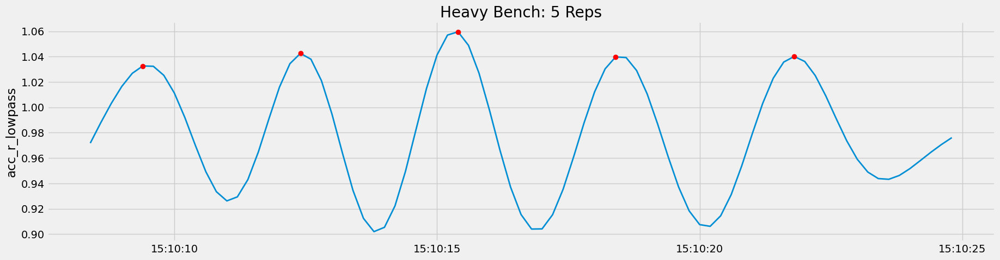

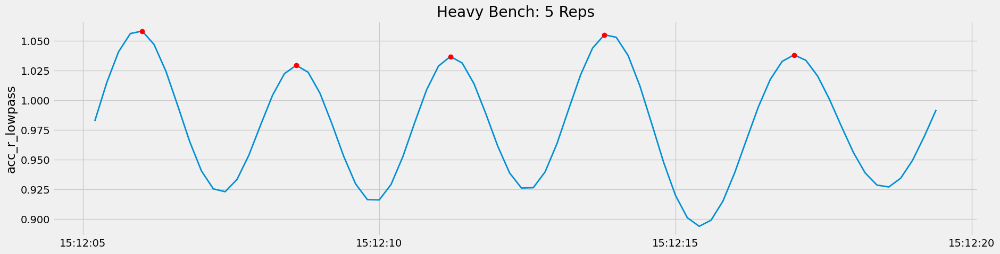

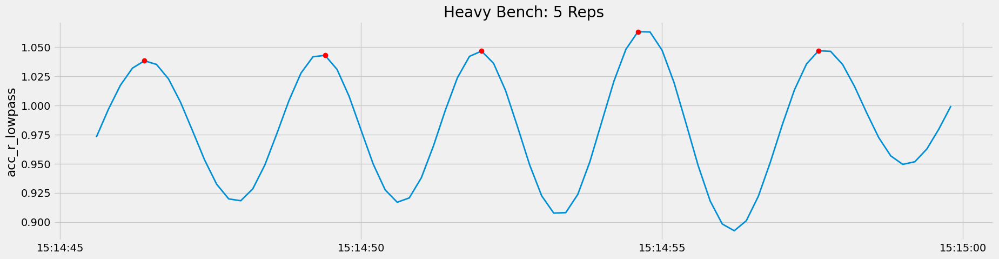

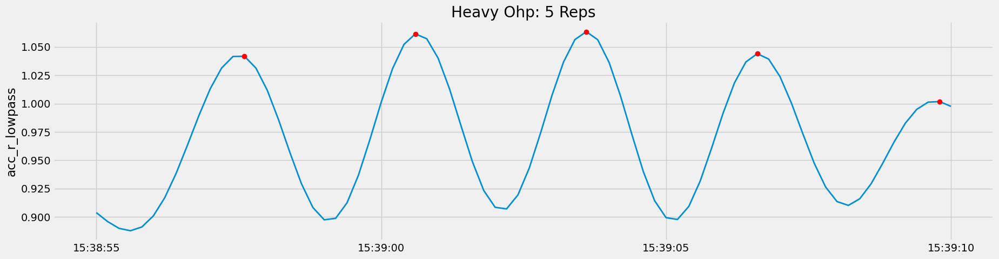

...

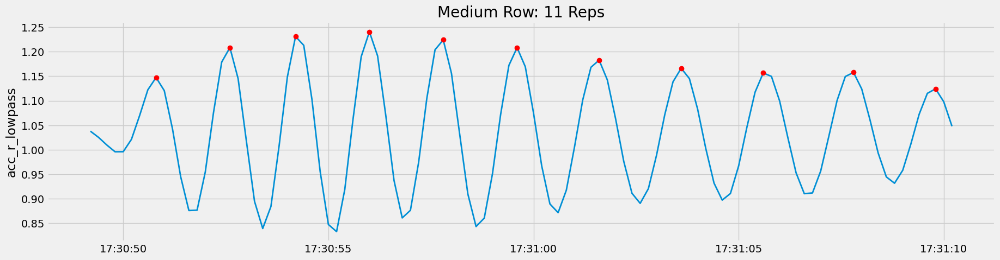

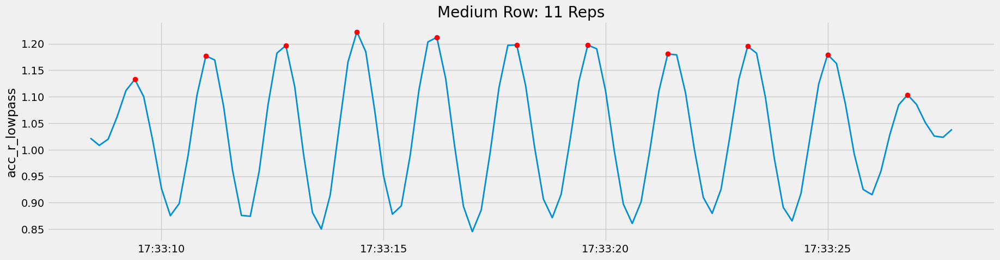

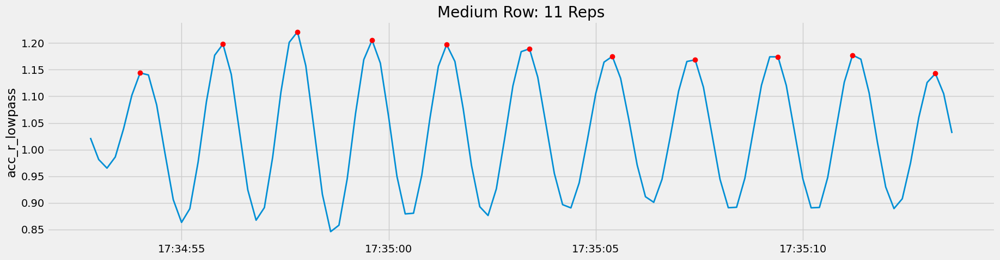

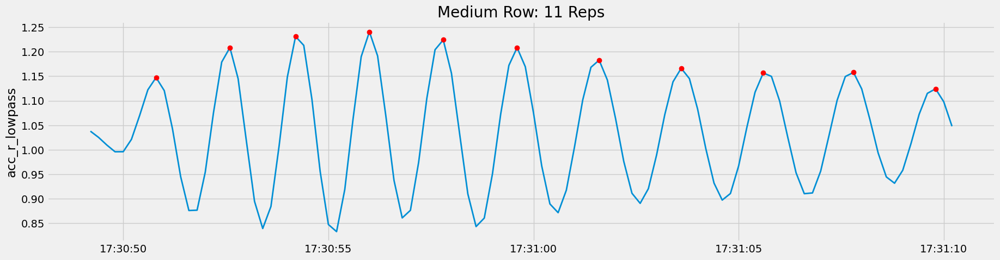

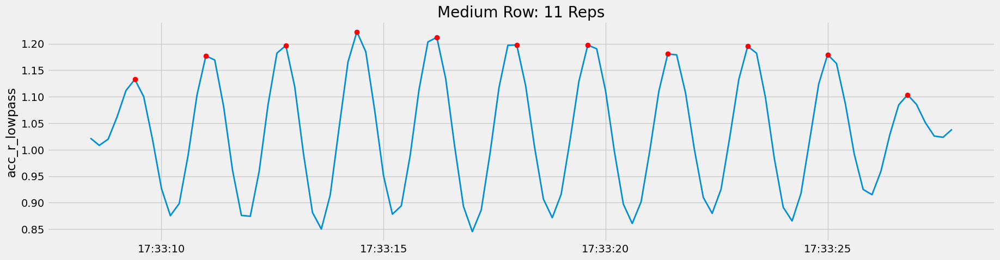

In [148]:
df['reps'] = df['category'].apply(lambda x : 5 if x =='heavy' else 10)
rep_df = df.groupby(['label','category','set'])['reps'].max().reset_index()
rep_df['reps_pred'] = 0

for s in df['set'].unique():
  subset = df[df['set']==s]

  column = 'acc_r'
  cutoff = 0.4



  if subset['label'].iloc[0]=='squat':
    cutoff = 0.35


  if subset['label'].iloc[0]=='row':
    cutoff = 0.65
    col = 'gyr_x'

  if subset['label'].iloc[0]=='ohp':
    cutoff = 0.35

  reps = count_reps(subset,cutoff = cutoff,column = column )

  rep_df.loc[rep_df['set']==s,'reps_pred']=reps




In [149]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,3,5,5
1,bench,heavy,7,5,4
2,bench,heavy,12,5,5
3,bench,heavy,20,5,5
4,bench,heavy,39,5,5
...,...,...,...,...,...
80,squat,medium,56,10,8
81,squat,medium,59,10,7
82,squat,medium,64,10,5
83,squat,medium,88,10,8


# Evaluate the results

In [150]:
error= mean_absolute_error(rep_df['reps'],rep_df['reps_pred']).round(2)
error

1.02

<Axes: xlabel='label,category'>

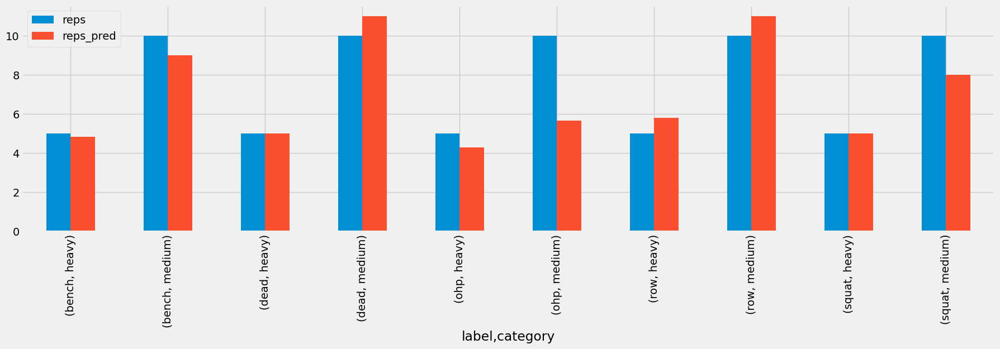

In [151]:
rep_df.groupby(['label','category'])[['reps', 'reps_pred']].mean().plot.bar()